In [33]:
DATA_PATH = 'data/askreddit_whats_your_reason_for_not_drinking_alcohol_clean_text.parquet'
TEXT_COLUMN = 'comment_body_clean'  

SAVE_PATH_PQT = 'data/askreddit_whats_your_reason_for_not_drinking_alcohol_comments_with_topics.parquet'    


In [2]:
import pandas as pd

# data = pd.read_excel(DATA_PATH)
data = pd.read_parquet(DATA_PATH)


# drop saved index if it exists
try:
    data.drop(columns=['Unnamed: 0'], inplace=True )
except KeyError:
    print("['Unnamed: 0'] not found in axis\n")

data.info()

['Unnamed: 0'] not found in axis

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14858 entries, 0 to 14857
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   main_submission_id    14858 non-null  object        
 1   comment_author        14858 non-null  object        
 2   comment_body          14858 non-null  object        
 3   comment_id            14858 non-null  object        
 4   comment_date_time     14858 non-null  datetime64[ns]
 5   comment_score         14858 non-null  int64         
 6   comment_parent_id     14858 non-null  object        
 7   comment_subreddit     14858 non-null  object        
 8   comment_permalink     14858 non-null  object        
 9   comment_is_submitter  14858 non-null  bool          
 10  comment_replies       14858 non-null  object        
 11  comment_depth         14858 non-null  int64         
 12  comment_body_clean    14858 non-null  ob

In [3]:
data.head()

,main_submission_id,comment_author,comment_body,comment_id,comment_date_time,comment_score,comment_parent_id,comment_subreddit,comment_permalink,comment_is_submitter,comment_replies,comment_depth,comment_body_clean
0,1hg10tp,Totallycasual,I grew up around alcohol abuse.,m2fq33p,2024-12-17 02:57:11,6032,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2g5v5v, m2g9j26, m2g7z9q, m2gc6pk, m2gvhjd, ...",0,i grew up around alcohol abuse
1,1hg10tp,666Needle-Dick,Because I always overdo it and have a hard tim...,m2fsp7h,2024-12-17 03:13:35,9961,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2gu1eu, m2g19qy, m2g9tzo, m2gcif7, m2gcihm, ...",0,because i always overdo it and have a hard tim...
2,1hg10tp,PurposeDramatic2468,"Social drinker, and not a social person most t...",m2fqdvq,2024-12-17 02:59:02,6401,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2h6rur, m2gdbsr, m2hf09p, m2hb2pe, m2hekfv, ...",0,social drinker and not a social person most times
3,1hg10tp,ocshoppers,Can't handle the hangovers anymore. They now l...,m2fqpbf,2024-12-17 03:00:59,7543,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2fs3tm, m2gaan7, m2g6kft, m2gdx4j, m2g9yhr, ...",0,can not handle the hangovers anymore they now ...
4,1hg10tp,pauldarkandhandsome,I don’t like the person I can’t remember that ...,m2ftlc6,2024-12-17 03:19:23,2139,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2gc6qi, m2hda2b, m2h5ojk, m2i60xo, m2h69ij, ...",0,i don t like the person i can t remember that ...


In [4]:
# check length of text 
data[TEXT_COLUMN].apply(len).describe() 

count    14858.000000
mean       187.123099
std        233.538588
min         30.000000
25%         63.000000
50%        117.000000
75%        222.000000
max       4894.000000
Name: comment_body_clean, dtype: float64

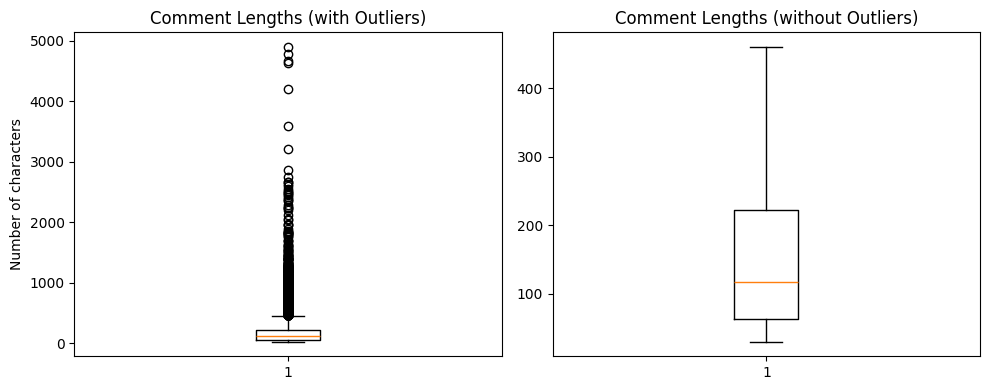

In [5]:
import matplotlib.pyplot as plt

comment_lengths = data[TEXT_COLUMN].apply(len)

# Create a figure with two subplots side by side
plt.figure(figsize=(10, 4))

# First plot: box plot showing outliers
plt.subplot(1, 2, 1)  # 1 row, 2 columns, first subplot
plt.boxplot(comment_lengths, vert=True, showfliers=True)
plt.title('Comment Lengths (with Outliers)')
plt.ylabel('Number of characters')

# Second plot: box plot without outliers
plt.subplot(1, 2, 2)  # 1 row, 2 columns, second subplot
plt.boxplot(comment_lengths, vert=True, showfliers=False)
plt.title('Comment Lengths (without Outliers)')

plt.tight_layout()
plt.show()


#  some comments are very long ( outliers -> these will be truncated in the topic analysys)
# most comments between 50 and 200 characters long

In [6]:
# check duplicated texts/rows
duplicates = data[data[TEXT_COLUMN].duplicated(keep=False)]
duplicates.sort_values(by=TEXT_COLUMN)    

# it appear some comment text is the same but comes from different users
# include all in analysis as it represent different people's opinion (maybe) -> there are not that many to make much of a difference potentially

,main_submission_id,comment_author,comment_body,comment_id,comment_date_time,comment_score,comment_parent_id,comment_subreddit,comment_permalink,comment_is_submitter,comment_replies,comment_depth,comment_body_clean
5805,1hg10tp,BobGnarly_,Because I'm at work right now.,m2hzr0r,2024-12-17 14:41:28,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,because i am at work right now
10751,1hg10tp,nifflr,Because I'm at work right now,m2kx4vw,2024-12-18 00:17:07,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,because i am at work right now
7317,1hg10tp,SummerPeach92,I don’t have any at the moment,m2ihv98,2024-12-17 16:23:07,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i don t have any at the moment
11424,1hg10tp,Dynamic_Duo_215,I don’t have any at the moment 🤷🏾‍♂️,m2lv0pq,2024-12-18 03:50:09,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i don t have any at the moment
2030,1hg10tp,No-Asparagus-5122,I hate the way it makes me feel.,m2gmoet,2024-12-17 07:13:45,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i hate the way it makes me feel
8427,1hg10tp,zyncoolmint420,I hate the way it makes me feel,m2iyz8q,2024-12-17 17:53:47,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i hate the way it makes me feel
1753,1hg10tp,LongwinterCipher,I just don't enjoy it anymore.,m2giyv2,2024-12-17 06:36:53,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i just do not enjoy it anymore
6197,1hg10tp,Confident_Catch8649,I just don't enjoy it anymore.,m2i4iic,2024-12-17 15:09:29,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i just do not enjoy it anymore
11521,1hg10tp,LateRain1970,I just don't like the taste of it.,m2m3w8d,2024-12-18 04:54:20,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i just do not like the taste of it
4856,1hg10tp,maggierae508,I just don't like the taste of it,m2hoa9b,2024-12-17 13:27:18,1,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,[],0,i just do not like the taste of it


Get topics

In [7]:
docs = data[TEXT_COLUMN]

In [8]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, PartOfSpeech
import plotly.express as px
from sklearn.feature_extraction.text import CountVectorizer

/Users/andreeanistor/Documents/data_sci_projects/ask_reddit_topicanalysis/askreddit_topics/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [9]:
# Initialize sentence transformer model
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")

# Create embeddings
embeddings = sentence_model.encode(docs, show_progress_bar=True)
embeddings.shape

Batches: 100%|██████████| 465/465 [00:54<00:00,  8.56it/s]


(14858, 384)

In [14]:
# The main representation of a topic
main_representation = KeyBERTInspired()

# # Additional ways of representing a topic
# aspect_model1 = PartOfSpeech("en_core_web_sm")
# aspect_model2 = [KeyBERTInspired(top_n_words=30), MaximalMarginalRelevance(diversity=.3)]

# Add all models together to be run in a single `fit`
representation_model = {
   "Main": main_representation,
#    "Aspect1":  aspect_model1,
#    "Aspect2":  aspect_model2
}

n_neighbors = 30    # this is the minimal number of documents you will consider a topic (any clusters below this number will be considered noise)
n_components = 5    # each document emebiding will be reducte from 384 dimentions to 5 (general advice: do not use higher dimentions over 7 : https://towardsdatascience.com/the-math-behind-the-curse-of-dimensionality-cf8780307d74)
# Initialize BERTopic
topic_model = BERTopic(
    embedding_model=sentence_model,
    umap_model=UMAP(n_neighbors=n_neighbors, n_components=n_components, min_dist=0.0, metric='cosine', random_state=42),
    hdbscan_model=HDBSCAN(min_cluster_size=n_neighbors, metric='euclidean', cluster_selection_method='eom', prediction_data=True),
    ctfidf_model=ClassTfidfTransformer(reduce_frequent_words=True),
    vectorizer_model=CountVectorizer(stop_words="english"),
    calculate_probabilities=True,
    representation_model=representation_model      # MaximalMarginalRelevance(diversity=0.3)      # PartOfSpeech("en_core_web_sm")  # KeyBERTInspired(),   # get more top words with : top_n_words=50
    # top_n_words=50

)

topics, probs = topic_model.fit_transform(docs)

In [15]:
from tabulate import tabulate

print(tabulate(topic_model.get_topic_info(), headers='keys', tablefmt="grid"))

# 0

+----+---------+---------+-----------------------------------------------------------+--------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [16]:
topic_term_matrix = topic_model.c_tf_idf_
words = topic_model.vectorizer_model.get_feature_names_out()
words.shape   # vocabulary

(14367,)

In [17]:
topic_model.visualize_heatmap()  # check topic similarity (the darker the color, the more similar the topics)

In [18]:
# extract hierarchical topics
hierarchical_topics = topic_model.hierarchical_topics(docs)

100%|██████████| 46/46 [00:21<00:00,  2.11it/s]


In [19]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)


In [20]:
# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
# reduced embedings are used for 2D visualisation purposes (you can choose to visualise in 3D if you change the plots accordingly)
reduced_embeddings = UMAP(n_neighbors=n_neighbors, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model.visualize_hierarchical_documents(docs, hierarchical_topics, reduced_embeddings=reduced_embeddings)

In [21]:
topic_model.visualize_documents(docs, reduced_embeddings=reduced_embeddings)

In [25]:
docs_with_topics = topic_model.get_document_info(docs)
docs_with_topics.head(3)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,i grew up around alcohol abuse,0,0_alcoholic_alcoholism_alcoholics_addiction,"[alcoholic, alcoholism, alcoholics, addiction,...",[i feel like a lot of it is hereditary and or ...,alcoholic - alcoholism - alcoholics - addictio...,0.059925,False
1,because i always overdo it and have a hard tim...,27,27_stopping_start_stopped_started,"[stopping, start, stopped, started, stop, habi...","[because when i start i can not stop, because ...",stopping - start - stopped - started - stop - ...,1.000000,False
2,social drinker and not a social person most times,21,21_drinker_beverage_social_socialize,"[drinker, beverage, social, socialize, sociall...",[honestly i can have fun just fine without it ...,drinker - beverage - social - socialize - soci...,1.000000,False


In [26]:
df_merged = data.join(docs_with_topics.set_index(data.index))
df_merged = df_merged.drop(columns=['Document'])
df_merged.head(3)

,main_submission_id,comment_author,comment_body,comment_id,comment_date_time,comment_score,comment_parent_id,comment_subreddit,comment_permalink,comment_is_submitter,comment_replies,comment_depth,comment_body_clean,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,1hg10tp,Totallycasual,I grew up around alcohol abuse.,m2fq33p,2024-12-17 02:57:11,6032,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2g5v5v, m2g9j26, m2g7z9q, m2gc6pk, m2gvhjd, ...",0,i grew up around alcohol abuse,0,0_alcoholic_alcoholism_alcoholics_addiction,"[alcoholic, alcoholism, alcoholics, addiction,...",[i feel like a lot of it is hereditary and or ...,alcoholic - alcoholism - alcoholics - addictio...,0.059925,False
1,1hg10tp,666Needle-Dick,Because I always overdo it and have a hard tim...,m2fsp7h,2024-12-17 03:13:35,9961,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2gu1eu, m2g19qy, m2g9tzo, m2gcif7, m2gcihm, ...",0,because i always overdo it and have a hard tim...,27,27_stopping_start_stopped_started,"[stopping, start, stopped, started, stop, habi...","[because when i start i can not stop, because ...",stopping - start - stopped - started - stop - ...,1.000000,False
2,1hg10tp,PurposeDramatic2468,"Social drinker, and not a social person most t...",m2fqdvq,2024-12-17 02:59:02,6401,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,"[m2h6rur, m2gdbsr, m2hf09p, m2hb2pe, m2hekfv, ...",0,social drinker and not a social person most times,21,21_drinker_beverage_social_socialize,"[drinker, beverage, social, socialize, sociall...",[honestly i can have fun just fine without it ...,drinker - beverage - social - socialize - soci...,1.000000,False


In [27]:
from tabulate import tabulate

print(tabulate(topic_model.get_topic_info()[['Topic', 'Name', 'Representative_Docs']], headers='keys', tablefmt="grid"))

+----+---------+-----------------------------------------------------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [36]:
# Rename columns to be better understood by non DS people
final_df = df_merged.rename(columns={
    'Name': 'Name_BERT',
    'Representative_Docs': 'Representative_Comments(list of examples)',
    'Representative_document': 'Representative_comment'
})

# add the reduced embedings as a column in the dataset 
final_df['embeddings'] = list(reduced_embeddings) 

final_df.head(3)

,main_submission_id,comment_author,comment_body,comment_id,comment_date_time,comment_score,comment_parent_id,comment_subreddit,comment_permalink,comment_is_submitter,...,comment_depth,comment_body_clean,Topic,Name_BERT,Representation,Representative_Comments(list of examples),Top_n_words,Probability,Representative_comment,embeddings
0,1hg10tp,Totallycasual,I grew up around alcohol abuse.,m2fq33p,2024-12-17 02:57:11,6032,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,...,0,i grew up around alcohol abuse,0,0_alcoholic_alcoholism_alcoholics_addiction,"[alcoholic, alcoholism, alcoholics, addiction,...",[i feel like a lot of it is hereditary and or ...,alcoholic - alcoholism - alcoholics - addictio...,0.059925,False,"[8.411978, 5.2014236]"
1,1hg10tp,666Needle-Dick,Because I always overdo it and have a hard tim...,m2fsp7h,2024-12-17 03:13:35,9961,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,...,0,because i always overdo it and have a hard tim...,27,27_stopping_start_stopped_started,"[stopping, start, stopped, started, stop, habi...","[because when i start i can not stop, because ...",stopping - start - stopped - started - stop - ...,1.000000,False,"[6.582992, 7.0865545]"
2,1hg10tp,PurposeDramatic2468,"Social drinker, and not a social person most t...",m2fqdvq,2024-12-17 02:59:02,6401,t3_1hg10tp,AskReddit,/r/AskReddit/comments/1hg10tp/whats_your_reaso...,False,...,0,social drinker and not a social person most times,21,21_drinker_beverage_social_socialize,"[drinker, beverage, social, socialize, sociall...",[honestly i can have fun just fine without it ...,drinker - beverage - social - socialize - soci...,1.000000,False,"[5.843967, 4.4217176]"


In [37]:
final_df.to_parquet(SAVE_PATH_PQT, engine='pyarrow')